## Airline Passenger Satisfaction - Clustering Section
In this notebook, I will work on clustering the airlines passenger satisfaction data.

Article that helped with applying supervised UMAP:
* https://towardsdatascience.com/umap-dimensionality-reduction-an-incredibly-robust-machine-learning-algorithm-b5acb01de568

In [1]:
import datashader as ds
import datashader.transfer_functions as tf
import datashader.bundling as bd
import matplotlib.pyplot as plt
import colorcet
import matplotlib.colors
import matplotlib.cm
import bokeh.plotting as bpl
import bokeh.transform as btr
import holoviews as hv
import holoviews.operation.datashader as hd

C:\Users\Eric\anaconda3\lib\site-packages\dask\dataframe\utils.py:367: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\Eric\anaconda3\lib\site-packages\dask\dataframe\utils.py:367: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
C:\Users\Eric\anaconda3\lib\site-packages\dask\dataframe\utils.py:367: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)


In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA, FactorAnalysis
from scipy.cluster.hierarchy import dendrogram, linkage
from umap import UMAP
import umap.plot

import os
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)

import warnings
warnings.filterwarnings('ignore')

In [3]:
train_df = pd.read_csv("train_df_cleaned.csv")
train_df.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
test_df = pd.read_csv("test_df_cleaned.csv")
test_df.drop(columns=['Unnamed: 0'], inplace=True)

In [5]:
train_df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied


## Variable Transformation
Since from here on out we cannot work with textual data as it stands, we will need to convert our categorical variables that are not yet numerical into numeric columns.

In [6]:
train_df.select_dtypes(include='object')

,Gender,Customer Type,Type of Travel,Class,satisfaction
0,Male,Loyal Customer,Personal Travel,Eco Plus,neutral or dissatisfied
1,Male,disloyal Customer,Business travel,Business,neutral or dissatisfied
2,Female,Loyal Customer,Business travel,Business,satisfied
3,Female,Loyal Customer,Business travel,Business,neutral or dissatisfied
4,Male,Loyal Customer,Business travel,Business,satisfied
...,...,...,...,...,...
103899,Female,disloyal Customer,Business travel,Eco,neutral or dissatisfied
103900,Male,Loyal Customer,Business travel,Business,satisfied
103901,Male,disloyal Customer,Business travel,Business,neutral or dissatisfied
103902,Female,disloyal Customer,Business travel,Eco,neutral or dissatisfied


Since some of these are binary, we can simply turn those columns into 0/1 binary columns.

In [7]:
train_df['Gender'] = train_df['Gender'].map({'Female':0, 'Male':1})
train_df['Customer Type'] = train_df['Customer Type'].map({'disloyal Customer':0, 'Loyal Customer':1})
train_df['Type of Travel'] = train_df['Type of Travel'].map({'Personal Travel':0, 'Business travel':1})
train_df['Class'] = train_df['Class'].map({'Eco':1, 'Eco Plus':2, 'Business':3})
train_df['satisfaction'] = train_df['satisfaction'].map({'neutral or dissatisfied':0, 'satisfied':1})

We need to transform the test dataframe in the same way.

In [8]:
test_df['Gender'] = test_df['Gender'].map({'Female':0, 'Male':1})
test_df['Customer Type'] = test_df['Customer Type'].map({'disloyal Customer':0, 'Loyal Customer':1})
test_df['Type of Travel'] = test_df['Type of Travel'].map({'Personal Travel':0, 'Business travel':1})
test_df['Class'] = test_df['Class'].map({'Eco':1, 'Eco Plus':2, 'Business':3})
test_df['satisfaction'] = test_df['satisfaction'].map({'neutral or dissatisfied':0, 'satisfied':1})

In [9]:
train_df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1


Before attempting to scale the data, let us first check the distribution of the data before deciding on a scaling method.

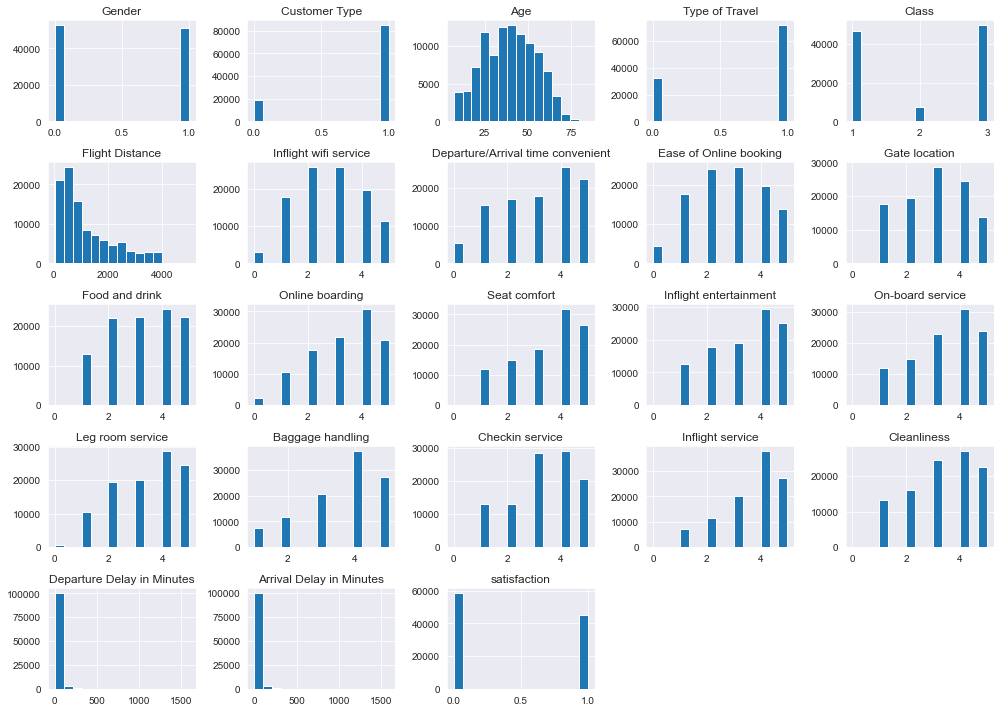

In [10]:
train_df.hist(figsize=(14,10), bins=15)
plt.tight_layout()
plt.show()

The categorical variables are a tiny bit skewed but otherwise fairly normal or binary. As far as continuous variables, age is fairly normally distributed, while flight distance is positively skewed. 

## Dimensionality Reduction
I'll first apply UMAP in a supervised manner to attempt to plot out separations between dissatisfied and satisfied records. Since we have many dimensions, I believe applying UMAP will be robust in this case as it looks at the global scope of the data.

In [11]:
#We first need to scale the data. We don't have negative values so we can use standard scaler
scaler = StandardScaler()
train_scaled = scaler.fit_transform(train_df)

In [12]:
umap_data = UMAP(n_neighbors=100, n_components=2, metric='euclidean', n_epochs=100, learning_rate=0.1, init='spectral',
                 min_dist=0.1, spread=1.0, low_memory=False, set_op_mix_ratio=1.0, local_connectivity=1,
                 repulsion_strength=1.0, negative_sample_rate=5, transform_queue_size=4.0, random_state=3,  
                 angular_rp_forest=False, target_n_neighbors=-1, transform_seed=3, verbose=False, unique=False)

In [13]:
umap_fit = umap_data.fit(train_scaled)

<AxesSubplot:>

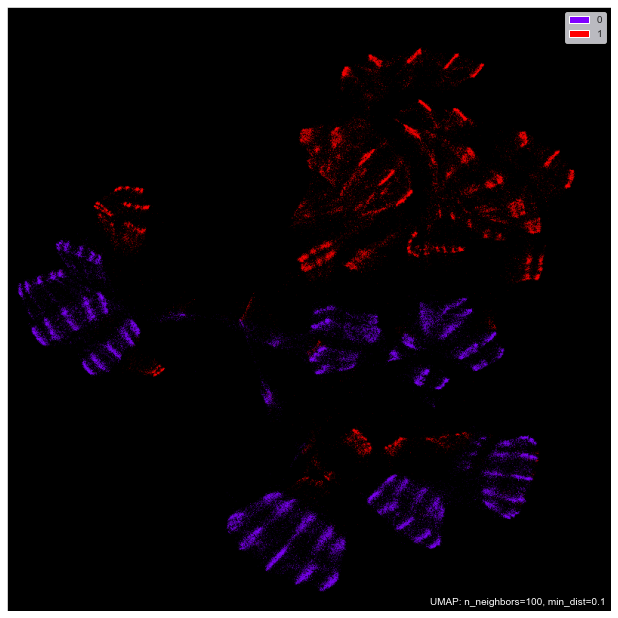

In [14]:
umap.plot.points(umap_fit, labels=train_df.satisfaction, theme='fire')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
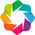

In [15]:
u_plot = umap.plot.interactive(umap_fit, labels=train_df.satisfaction, point_size=2)
umap.plot.show(u_plot)

The two reduced components appear to take very consistent shapes within their groups, and are fairly well distinguished between groups.

Let's now apply UMAP in a supervised fashion to split the data on its satisfied and dissatisfied records.

In [16]:
train_df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1


In [17]:
train_df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1


In [18]:
test_df.head()

,Unnamed: 0.1,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,19556,0,1,52,1,1,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,1
1,1,90035,0,1,36,1,3,2863,1,1,3,1,5,4,5,4,4,4,4,3,4,5,0,0.0,1
2,2,12360,1,0,20,1,1,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,0
3,3,77959,1,1,44,1,3,3377,0,0,0,2,3,4,4,1,1,1,1,3,1,4,0,6.0,1
4,4,36875,0,1,49,1,1,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,1


In [19]:
test_df.drop(columns=['Unnamed: 0.1', 'id'], inplace=True)

In [20]:
#Creating train test splits from the data
X_train, y_train = train_df.loc[:, :'Arrival Delay in Minutes'], train_df['satisfaction']

In [21]:
X_test, y_test = test_df.loc[:, :'Arrival Delay in Minutes'], test_df['satisfaction']

In [22]:
X_train.shape

(103904, 22)

In [23]:
X_test.shape

(25976, 22)

In [24]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [25]:
umap_data2 = UMAP(n_neighbors=100, n_components=2, metric='euclidean', n_epochs=100, learning_rate=0.1, init='spectral',
                 min_dist=0.1, spread=1.0, low_memory=False, set_op_mix_ratio=1.0, local_connectivity=1,
                 repulsion_strength=1.0, negative_sample_rate=5, transform_queue_size=4.0, random_state=3,  
                 angular_rp_forest=False, target_n_neighbors=-1, transform_seed=3, verbose=False, unique=False)

In [26]:
X_train_umap = umap_data2.fit_transform(X_train_scaled, y_train)

In [27]:
X_test_umap = umap_data2.transform(X_test_scaled)

In [28]:
X_train_umap.shape

(103904, 2)

In [29]:
X_test_umap.shape

(25976, 2)

In [30]:
y_test.shape

(25976,)

In [31]:
X_train_umap[:,0].shape

(103904,)

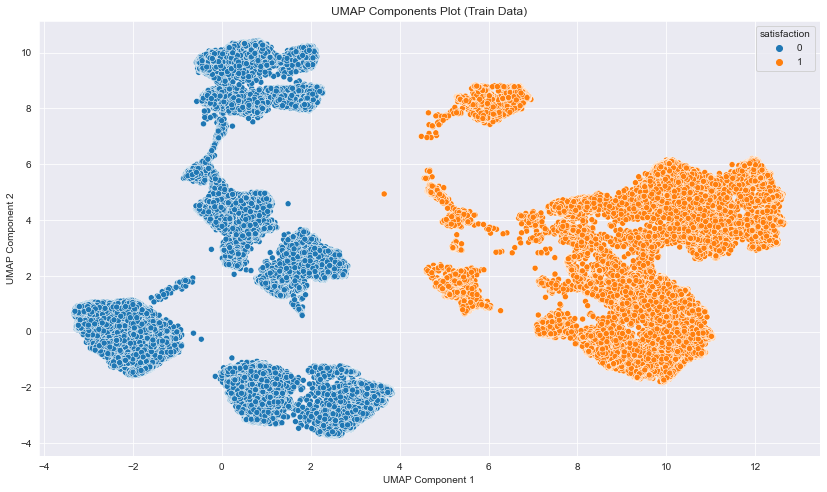

In [32]:
plt.figure(figsize=(14,8))
sns.scatterplot(x=X_train_umap[:,0], y=X_train_umap[:,1], hue=y_train)
plt.title('UMAP Components Plot (Train Data)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.show()

The resulting UMAP graph of the train data takes a very interesting shape. Almost all of the points are very distinguished except for some overlap near the middle of the graph.

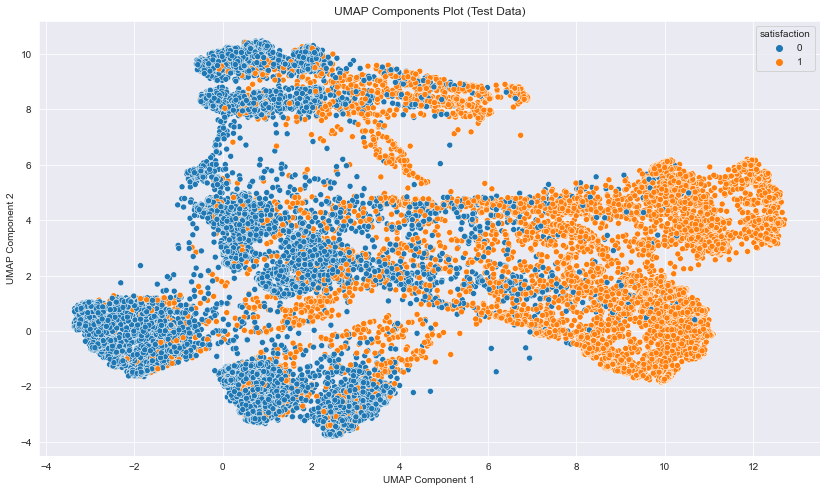

In [33]:
plt.figure(figsize=(14,8))
sns.scatterplot(x=X_test_umap[:,0], y=X_test_umap[:,1], hue=y_test)
plt.title('UMAP Components Plot (Test Data)')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.show()

It can separate the data descently well, but of course it isn't perfect. We can still use the components and attempt to fit clustering algorithms to the data and check the results.

### K-Means Clustering w/ UMAP Components

In [34]:
train_df_umap = pd.concat([train_df, pd.DataFrame(X_train_umap, columns=['UMAP1', 'UMAP2'])], axis=1)

In [35]:
#Now we can try to apply K-Means and DBSCAN
train_df_umap

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0,-2.956450,0.900261
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0,1.186530,8.724575
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1,9.965812,0.051940
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0,1.654054,3.140802
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,10.599941,4.779092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,23,1,1,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,0,-0.212249,9.787780
103900,1,1,49,1,3,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,1,12.121822,5.505680
103901,1,0,30,1,3,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,0,1.861303,8.137849
103902,0,0,22,1,1,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,0,-0.441175,9.708157


Now we'll try K-Means and get the optimal number of clusters from the 2 UMAP components.

In [36]:
wcss = []

for i in range(1, 18):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(X_train_umap)
    wcss.append(kmeans.inertia_)

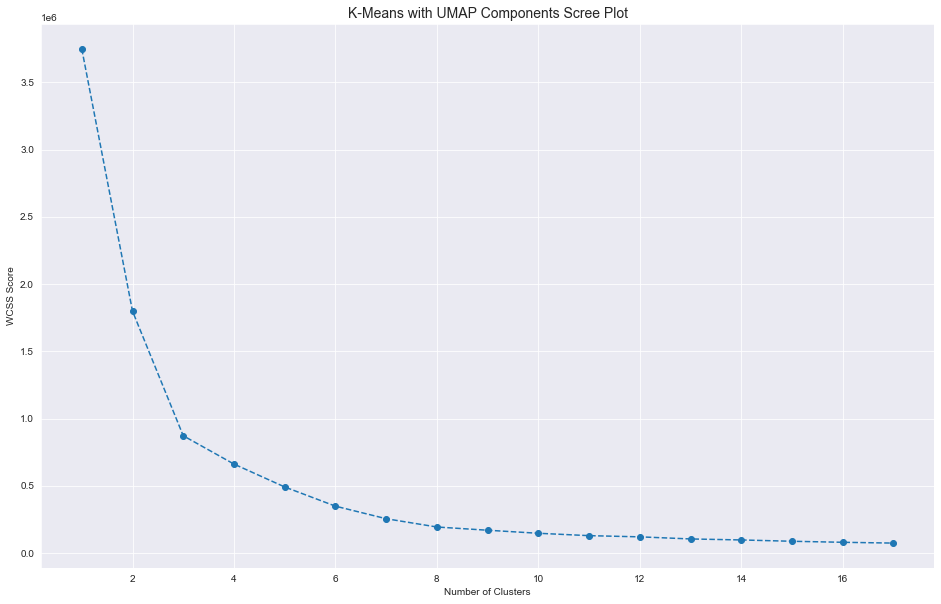

In [37]:
plt.figure(figsize=(16,10))
plt.plot(range(1, 18), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS Score')
plt.title('K-Means with UMAP Components Scree Plot', fontsize=14)
plt.show()

The hardest curve bend in the scree plot comes at using 3 clusters, so we'll use 3 clusters for K-Means.

In [38]:
kmeans_umap = KMeans(n_clusters=3, init='k-means++', random_state=3)
kmeans_umap.fit(X_train_umap)

KMeans(n_clusters=3, random_state=3)

In [39]:
train_df_umap['K-Means UMAP Segment'] = kmeans_umap.labels_
train_df_umap

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2,K-Means UMAP Segment
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0,-2.956450,0.900261,1
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0,1.186530,8.724575,2
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1,9.965812,0.051940,0
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0,1.654054,3.140802,1
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,10.599941,4.779092,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,23,1,1,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,0,-0.212249,9.787780,2
103900,1,1,49,1,3,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,1,12.121822,5.505680,0
103901,1,0,30,1,3,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,0,1.861303,8.137849,2
103902,0,0,22,1,1,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,0,-0.441175,9.708157,2


In [40]:
#Attribute averages for each K-Means segment
train_df_umap_freq = train_df_umap.groupby(['K-Means UMAP Segment']).mean()
train_df_umap_freq

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2
K-Means UMAP Segment,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.501329,0.997342,43.245878,0.919730,2.600792,1617.076259,3.100423,2.996776,2.960899,2.994955,3.567006,4.068950,4.069049,4.058886,3.872066,3.870860,3.950121,3.635489,3.952926,3.815887,12.981028,12.991978,0.999975,9.472361,2.418514
1,0.446165,0.998797,39.695544,0.278120,1.587669,1010.421954,2.387352,3.454406,2.551992,2.948225,3.003276,2.756430,3.119494,2.877588,3.048397,2.904563,3.314898,3.106928,3.348399,2.945947,11.456940,11.931564,0.000077,0.301385,-0.204305
2,0.552681,0.221841,32.375439,0.967718,1.777456,760.281156,2.659819,2.530484,2.745174,2.992808,2.910387,2.673129,2.898400,2.957260,3.099161,3.199025,3.609060,3.066714,3.587153,2.946637,23.321705,23.901542,0.181251,1.521701,7.866687


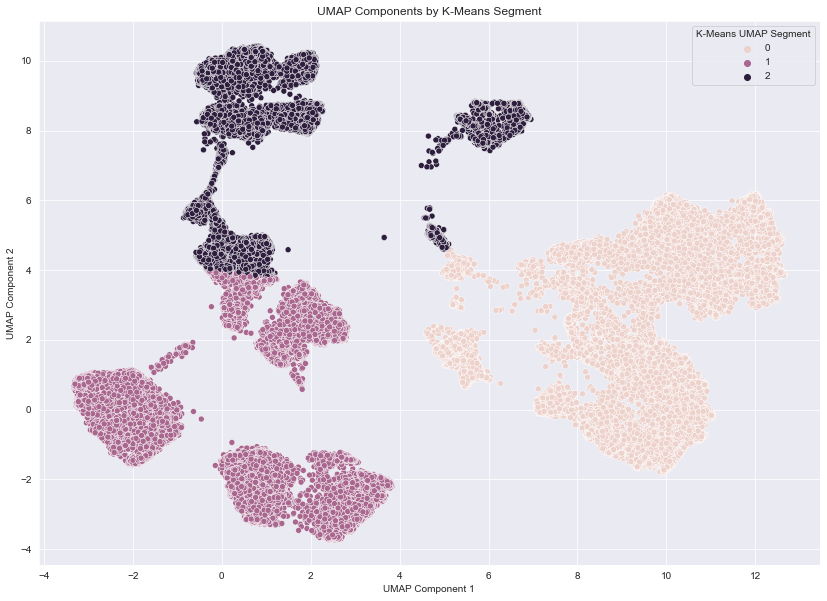

In [41]:
plt.figure(figsize=(14,10))
sns.scatterplot(x='UMAP1' ,y='UMAP2', hue='K-Means UMAP Segment', data=train_df_umap)
plt.title('UMAP Components by K-Means Segment')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.show()

In [42]:
train_df_umap['K-Means UMAP Segment'].value_counts()

0    40638
1    39073
2    24193
Name: K-Means UMAP Segment, dtype: int64

Since the groups picked up by UMAP seem to be clumps of data together, I believe DBSCAN would definitely be worth trying, since DBSCAN creates clusters based on the density of points and utilizes core points to grow clusters in the data.

### DBSCAN Clustering w/ UMAP Components

In [43]:
train_df_umap.drop(columns=['K-Means UMAP Segment'], inplace=True)
train_df_umap.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0,-2.956450,0.900261
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0,1.186530,8.724575
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1,9.965812,0.051940
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0,1.654054,3.140802
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,10.599941,4.779092


In [44]:
dbscan_umap = DBSCAN(eps=0.5, min_samples=5, metric='euclidean', n_jobs=-1)

In [45]:
dbscan_umap.fit(X_train_umap)

DBSCAN(n_jobs=-1)

In [46]:
print(np.unique(dbscan_umap.labels_))

[-1  0  1  2  3  4  5]


In [47]:
train_df_umap['DBSCAN UMAP Segment'] = dbscan_umap.labels_
train_df_umap

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2,DBSCAN UMAP Segment
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0,-2.956450,0.900261,0
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0,1.186530,8.724575,1
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1,9.965812,0.051940,2
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0,1.654054,3.140802,1
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,10.599941,4.779092,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,23,1,1,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,0,-0.212249,9.787780,1
103900,1,1,49,1,3,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,1,12.121822,5.505680,2
103901,1,0,30,1,3,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,0,1.861303,8.137849,1
103902,0,0,22,1,1,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,0,-0.441175,9.708157,1


In [48]:
#Attribute averages for each K-Means segment
train_df_umap_freq = train_df_umap.groupby(['DBSCAN UMAP Segment']).mean()
train_df_umap_freq

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2
DBSCAN UMAP Segment,,,,,,,,,,,,,,,,,,,,,,,,,
-1,0.000000,0.000000,21.500000,1.000000,1.000000,1340.000000,2.500000,2.000000,2.000000,3.500000,2.000000,2.500000,2.500000,2.000000,4.000000,5.000000,5.000000,4.500000,4.000000,2.000000,3.500000,1.500000,1.000000,3.651771,4.932486
0,0.998161,0.998088,37.881150,0.004266,1.180555,781.743473,2.392734,3.639847,2.360594,2.929617,3.055821,2.366257,3.008164,3.067441,3.355740,3.245128,3.752298,3.343826,3.796867,3.063985,11.030448,11.205339,0.000147,-2.125697,-0.107939
1,0.476631,0.527975,36.842245,0.974720,1.950354,1058.944541,2.402489,2.656857,2.713068,3.027142,2.833001,2.608322,2.884737,2.739165,2.781951,2.945031,3.196492,2.767253,3.188065,2.749747,21.590391,22.401738,0.000065,0.849555,6.030168
2,0.500374,0.979714,43.263565,0.981157,2.683155,1653.146101,2.955020,2.921691,2.822245,2.997835,3.586570,3.997500,4.107437,4.106998,3.907282,3.886377,3.976750,3.656915,3.975409,3.847609,13.420312,13.472174,0.999974,9.658464,2.523307
3,0.035722,0.999114,38.786284,0.000614,1.304724,793.623355,2.400368,3.640807,2.371804,2.912400,3.128161,3.023928,3.378758,3.057059,3.202195,2.850365,3.401663,3.339423,3.429682,3.206694,10.969255,11.404390,0.000068,1.759689,-2.374004
4,0.502568,0.996839,37.650336,0.000000,1.245753,809.903595,4.497432,3.683524,4.309364,2.899249,3.131173,4.122876,3.205847,3.062821,3.283682,3.500198,3.579613,3.339787,3.647965,3.134729,5.065192,4.367839,1.000000,5.348805,1.531461
5,0.488492,0.000000,28.686163,0.996209,2.321960,733.648253,4.412402,2.994855,4.359058,2.823179,3.105605,4.281885,3.009207,3.092878,3.726780,3.369347,4.123477,3.742215,4.127539,3.078798,9.209856,8.985919,1.000000,6.055369,8.261048


As far as our target attribute goes, about four groups relate to satisfied reviews, and three relate to dissatisfied groups. Let's now plot the DBSCAN results in a scatterplot.

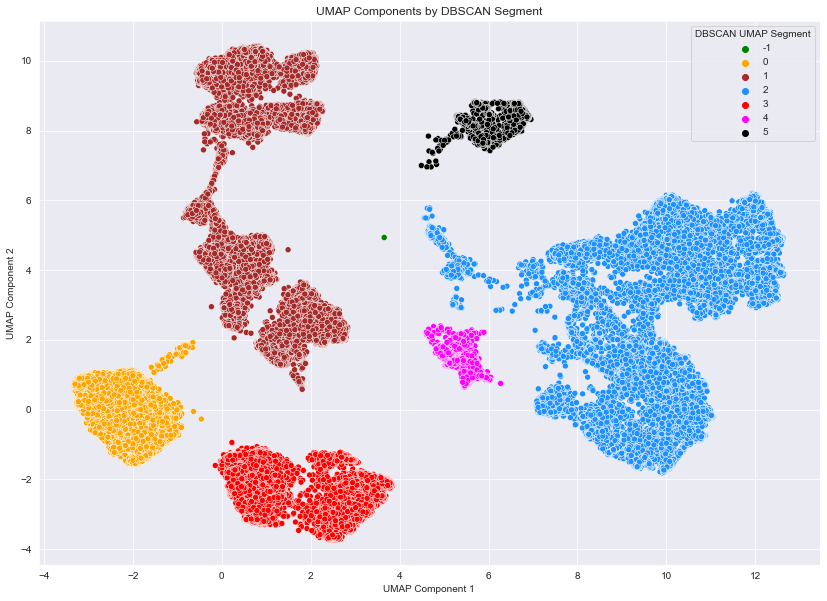

In [49]:
plt.figure(figsize=(14,10))
sns.scatterplot(x='UMAP1' ,y='UMAP2', hue='DBSCAN UMAP Segment', data=train_df_umap, palette=['green','orange','brown','dodgerblue','red', 'magenta', 'black'])
plt.title('UMAP Components by DBSCAN Segment')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.show()

Judging from the above clustering methods, I believe DBSCAN does a better job of clustering the UMAP components than K-Means does, and will carry this over into the next steps of the project.

Ignoring the outlier segment, we have some clusters with larger representation, and a few smaller segments.

## PCA
It doesn't immediately appear UMAP works well enough using just 2 components. Let's try PCA instead, since UMAP also took a very long time to converge.

In [51]:
#First trying the default number of components
pca = PCA()
pca.fit(train_scaled)
print(pca.explained_variance_ratio_)

[0.19694895 0.10322676 0.09574279 0.08613542 0.0838923  0.06512083
 0.04445539 0.04231261 0.04060252 0.03582535 0.03011947 0.02516734
 0.02095897 0.02039327 0.01871978 0.01738729 0.01594674 0.01374148
 0.01272503 0.01137064 0.00990722 0.00757427 0.00172557]


In [52]:
len(pca.explained_variance_ratio_)

23

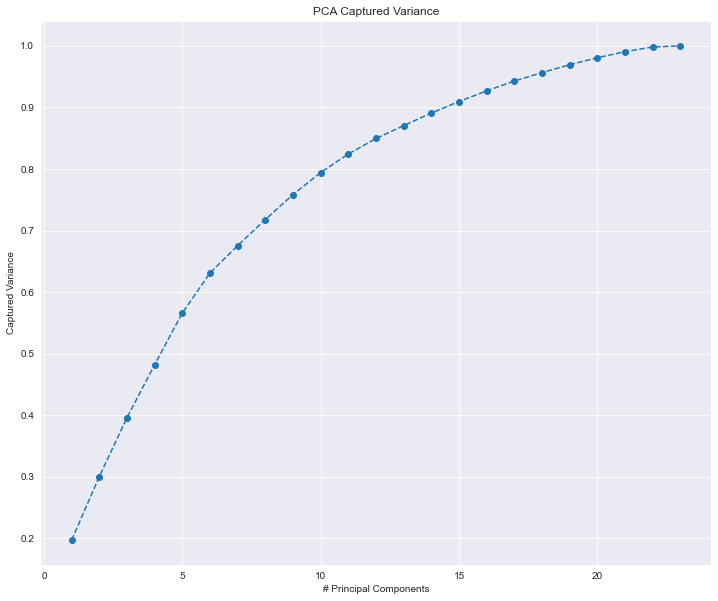

In [53]:
plt.figure(figsize=(12,10))
plt.plot(range(1, 24), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--', )
plt.title('PCA Captured Variance')
plt.xlabel('# Principal Components')
plt.ylabel('Captured Variance')
plt.show()

Using PCA, it appears we need 11 components to capture at least 80% of the variance in the data. It may be cumbersome to apply all of these components, but we can still experiment so long as the training doesn't take too long.

Therefore, I will pass on PCA as a dimensionality reduction technique, as too many components are required to capture adequate variance.

In [54]:
test_df_umap = pd.concat([test_df, pd.DataFrame(X_test_umap, columns=['UMAP1', 'UMAP2'])], axis=1)

In [55]:
train_df_umap

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2,DBSCAN UMAP Segment
0,1,1,13,0,2,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0,-2.956450,0.900261,0
1,1,0,25,1,3,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0,1.186530,8.724575,1
2,0,1,26,1,3,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1,9.965812,0.051940,2
3,0,1,25,1,3,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0,1.654054,3.140802,1
4,1,1,61,1,3,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1,10.599941,4.779092,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,23,1,1,192,2,1,2,3,2,2,2,2,3,1,4,2,3,2,3,0.0,0,-0.212249,9.787780,1
103900,1,1,49,1,3,2347,4,4,4,4,2,4,5,5,5,5,5,5,5,4,0,0.0,1,12.121822,5.505680,2
103901,1,0,30,1,3,1995,1,1,1,3,4,1,5,4,3,2,4,5,5,4,7,14.0,0,1.861303,8.137849,1
103902,0,0,22,1,1,1000,1,1,1,5,1,1,1,1,4,5,1,5,4,1,0,0.0,0,-0.441175,9.708157,1


In [56]:
test_df_umap

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2
0,0,1,52,1,1,160,5,4,3,4,3,4,3,5,5,5,5,2,5,5,50,44.0,1,7.570079,-0.094383
1,0,1,36,1,3,2863,1,1,3,1,5,4,5,4,4,4,4,3,4,5,0,0.0,1,10.559403,-0.330107
2,1,0,20,1,1,192,2,0,2,4,2,2,2,2,4,1,3,2,2,2,0,0.0,0,-0.071821,8.403857
3,1,1,44,1,3,3377,0,0,0,2,3,4,4,1,1,1,1,3,1,4,0,6.0,1,6.645593,1.915743
4,0,1,49,1,1,1182,2,3,4,3,4,1,2,2,2,2,2,4,2,4,0,20.0,1,1.891310,1.471623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25971,1,0,34,1,3,526,3,3,3,1,4,3,4,4,3,2,4,4,5,4,0,0.0,0,2.036462,8.072614
25972,1,1,23,1,3,646,4,4,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,1,9.933136,5.128823
25973,0,1,17,0,1,828,2,5,1,5,2,1,2,2,4,3,4,5,4,2,0,0.0,0,0.187107,-1.767941
25974,1,1,14,1,3,1127,3,3,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,1,10.076128,4.342933


Let's now interpret the clusters that DBSCAN returned through our data. Like previously mentioned, discounting the outlier cluster with only 2 observations, we have six clusters. It's interesting we have 3 clusters that correspond to dissatisfaction and 3 clusters that respond to satisfaction.

In [57]:
#I will attempt to give the clusters appropriate names
train_df_umap['DBSCAN UMAP Segment'] = train_df_umap['DBSCAN UMAP Segment'].map({-1:'Outlier', 0:'Dissatisfied Male Personal Travlers', 1:'Dissatisfied Business Travelers', 2:'Satisfied Long Distance Business Travelers', 3:'Dissatisfied Female Personal Travelers', 4:'Satisfied Loyal Personal Travelers', 5:'Satisfied Disloyal Business Travelers'})

In [58]:
#0,1,3 -> dissatisfaction. 2,4,5 -> satisfaction
train_df_umap_freq = train_df_umap.groupby(['DBSCAN UMAP Segment']).mean()
train_df_umap_freq['Obs.'] = train_df_umap[['DBSCAN UMAP Segment', 'Gender']].groupby(['DBSCAN UMAP Segment']).count()
train_df_umap_freq['Obs. Prop.'] = train_df_umap_freq['Obs.'] / train_df_umap_freq['Obs.'].sum()

train_df_umap_freq

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,UMAP1,UMAP2,Obs.,Obs. Prop.
DBSCAN UMAP Segment,,,,,,,,,,,,,,,,,,,,,,,,,,,
Dissatisfied Business Travelers,0.476631,0.527975,36.842245,0.974720,1.950354,1058.944541,2.402489,2.656857,2.713068,3.027142,2.833001,2.608322,2.884737,2.739165,2.781951,2.945031,3.196492,2.767253,3.188065,2.749747,21.590391,22.401738,0.000065,0.849555,6.030168,30617,0.294666
Dissatisfied Female Personal Travelers,0.035722,0.999114,38.786284,0.000614,1.304724,793.623355,2.400368,3.640807,2.371804,2.912400,3.128161,3.023928,3.378758,3.057059,3.202195,2.850365,3.401663,3.339423,3.429682,3.206694,10.969255,11.404390,0.000068,1.759689,-2.374004,14669,0.141178
Dissatisfied Male Personal Travlers,0.998161,0.998088,37.881150,0.004266,1.180555,781.743473,2.392734,3.639847,2.360594,2.929617,3.055821,2.366257,3.008164,3.067441,3.355740,3.245128,3.752298,3.343826,3.796867,3.063985,11.030448,11.205339,0.000147,-2.125697,-0.107939,13597,0.130861
Outlier,0.000000,0.000000,21.500000,1.000000,1.000000,1340.000000,2.500000,2.000000,2.000000,3.500000,2.000000,2.500000,2.500000,2.000000,4.000000,5.000000,5.000000,4.500000,4.000000,2.000000,3.500000,1.500000,1.000000,3.651771,4.932486,2,0.000019
Satisfied Disloyal Business Travelers,0.488492,0.000000,28.686163,0.996209,2.321960,733.648253,4.412402,2.994855,4.359058,2.823179,3.105605,4.281885,3.009207,3.092878,3.726780,3.369347,4.123477,3.742215,4.127539,3.078798,9.209856,8.985919,1.000000,6.055369,8.261048,3693,0.035542
Satisfied Long Distance Business Travelers,0.500374,0.979714,43.263565,0.981157,2.683155,1653.146101,2.955020,2.921691,2.822245,2.997835,3.586570,3.997500,4.107437,4.106998,3.907282,3.886377,3.976750,3.656915,3.975409,3.847609,13.420312,13.472174,0.999974,9.658464,2.523307,38795,0.373373
Satisfied Loyal Personal Travelers,0.502568,0.996839,37.650336,0.000000,1.245753,809.903595,4.497432,3.683524,4.309364,2.899249,3.131173,4.122876,3.205847,3.062821,3.283682,3.500198,3.579613,3.339787,3.647965,3.134729,5.065192,4.367839,1.000000,5.348805,1.531461,2531,0.024359


## DBSCAN Cluster Analysis:
* The last cluster describes passengers satisfied with their flight experience and were disloyal customers. The other 'satisfied' clusters consistent of primarily loyal customers.


* The satisfied clusters don't seem to depend much on age, as each age average in these clusters are quite different.


* Cluster 4 consists of only personal traveling loyal customers. Across all groups, the 1-5 quality ratings for flight amenities primarily lay in the 3-4 range. 


* The Flight Distance doesn't seem to influence the satisfaction much, but to a small degree, longer flights seem to incline more flight satisfaction.


* Inflight Wifi does appear to be quite important, as 2/3 satisfied clusters had a much higher average Wifi rating than the clusters who were dissatisfied. Ease of online booking and Online boarding also had higher average ratings for 2/3 satisfied clusters. 


* Satisfied clusters of course are more so on the lower end of flight delays.

In [59]:
train_df_umap.to_csv("train_df_umap.csv")
test_df_umap.to_csv("test_df_umap.csv")

In the following notebook, we will utilize the UMAP components that augment our data and build classification models to predict satisfaction of passengers.